In [1]:
import sys
sys.path.append('../')
from utils import *
import librosa
import pandas as pd
import json
import cv2
import os
import ffmpeg
import librosa
import soundfile
import shutil
from IPython.display import Video

Hardcoded values - to be added to metadata.json

In [2]:
mix_audio_path = 'Data/VS_Shree_1235_1321.mp4'
annotations = 'Data/Observer.csv'
temp_folder = 'Data/Temp/'

Functions - to be added to a separate file

In [3]:
def drawHandTap(ax, handTaps, c='purple'):
    '''Plots the hand taps as vertical lines on the axis ax'''
    for handTap in handTaps:
        ax.axvline(handTap, linestyle='--', c=c, alpha=0.6)
    return ax

### Play video being analysed

In [4]:
Video(mix_audio_path, embed=True)

### View Spectogram of the mixed audio

Load audio

In [5]:
y, sr = librosa.load(mix_audio_path)

/home/nithya/anaconda3/envs/osfVis/lib/python3.9/site-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


##### Load hand tap annotation
Only tap_s has been used here. I was thinking I could make a parameter for a function used while plotting the spetrogram, where a person could choose to view:
<ol>
    <li>No hand taps</li>
    <li>Only hand taps of singer and harmonium player - in different colours</li>
    <li>Only hand movements of the 3 tanpuras - in different colours</li>
    <li>All 5 handmovements</li>
</ol>

In [6]:
obs = pd.read_csv(annotations)

In [7]:
%%capture
# initialise figure, with 3 subplots
fig, axs = generateFig(2, (14, 7), [2, 3])

In [8]:
# plot waveplot
axs[0] = drawWave(audioPath=mix_audio_path, ax=axs[0], annotate=False)
# plot spetogram 1
axs[1] = spectrogram(audioPath=mix_audio_path, cmap='Blues', ax=axs[1], yticks=True, xticks=True, annotate=False)
axs[1] = drawHandTap(axs[1], obs['Tap_S'])

/home/nithya/anaconda3/envs/osfVis/lib/python3.9/site-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/home/nithya/anaconda3/envs/osfVis/lib/python3.9/site-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


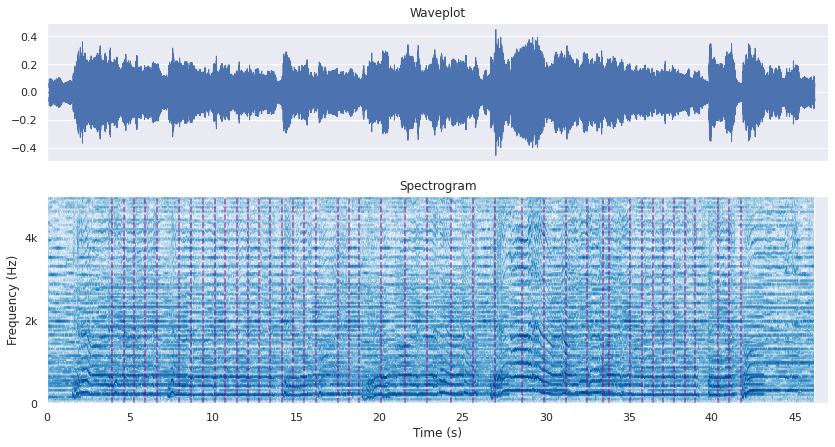

In [9]:
fig

### Draw on the frames that have hand taps (only by tap_S for now)

Create a temporary folder to store all intermediate results in

In [10]:
os.mkdir(temp_folder)

Create a video where frames with hand taps from tap_s have been marked and store it in the temp folder

In [74]:
cap_vid = cv2.VideoCapture(mix_audio_path)
fps = cap_vid.get(cv2.CAP_PROP_FPS)
tap_s = np.around(obs['Tap_S'].values * 25)# frame number with hand taps

In [75]:
output = cv2.VideoWriter(os.path.join(temp_folder, 'test.avi'), cv2.VideoWriter_fourcc(*"XVID"), 25, (720, 576))

In [76]:
i = 0
while(cap_vid.isOpened()):
    ret, frame = cap_vid.read()
    if ret == True:
        i+=1
        if i in tap_s:
            frame = cv2.rectangle(frame,(int(0.5*720)-20,int(0.3*576)-20),(int(0.5*720)+20,int(0.3*576)+20),(255,0,255),3)
        output.write(frame)
    else:
        print('Stream disconnected')
        break

Stream disconnected


Add clicks to the audio where hand taps are present and store it as a separate file in the temp folder

In [77]:
song, sr = librosa.load('Data/VS_Shree_1235_1321.mp4',sr=None)
click_track = librosa.clicks(obs['Tap_S'].values, sr=sr, length=len(song))
mix_song = 0.8*song + 0.2*click_track
soundfile.write(os.path.join(temp_folder, 'test.wav'), mix_song, sr)

/home/nithya/anaconda3/envs/osfVis/lib/python3.9/site-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Combine the audio and video files and store it in the temp folder

In [78]:
# os.system("ffmpeg -i 'Data/test.mp4' -i 'Data/VS_Shree_1235_1321.mp4' -c copy -map 0:0 -map 1:1 -y 'Data/testWSound.mp4'")
vid_file = ffmpeg.input(os.path.join(temp_folder, 'test.avi'))
audio_file = ffmpeg.input(os.path.join(temp_folder, 'test.wav'))
(
    ffmpeg
    .concat(vid_file.video, audio_file.audio, v=1, a=1)
    .output(os.path.join(temp_folder, 'testWSound.mp4'))
    .overwrite_output()
    .run()
)

(None, None)

Release open CV objects being used

In [79]:
cap_vid.release()
output.release()

### View the file created

In [80]:
Video(os.path.join(temp_folder, "testWSound.mp4"), embed=True)

Delete the temp folder

In [18]:
shutil.rmtree(temp_folder)